In [1]:
from tensorflow.keras.layers import *
from tensorflow.keras import Model, models
from tensorflow.keras.optimizers import *
from tensorflow.keras.initializers import RandomNormal
#from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
from tensorflow.keras import backend as K
from tensorflow.keras import regularizers
import random
from keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import cv2

from IPython.display import SVG
#from keras.utils.vis_utils import model_to_dot

import tensorflow.keras
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import pyplot
from PIL import Image 
import os

#os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "5"

In [2]:
from custom_loss import Weighted_BCEnDice_loss
from custom_metric import mean_iou, dice_coef

import nibabel as nib

In [3]:
def C_0(y_true, y_pred, smooth=1.0):
    y_true_f = K.flatten(y_true[:,:,:,0])
    y_pred_f = K.flatten(y_pred[:,:,:,0])
    intersection = K.sum(y_true_f * y_pred_f)
    loss = ((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))
    return loss

def C_1(y_true, y_pred, smooth=1.0):
    y_true_f = K.flatten(y_true[:,:,:,1])
    y_pred_f = K.flatten(y_pred[:,:,:,1])
    intersection = K.sum(y_true_f * y_pred_f)
    loss = ((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))
    return loss
def C_2(y_true, y_pred, smooth=1.0):
    y_true_f = K.flatten(y_true[:,:,:,2])
    y_pred_f = K.flatten(y_pred[:,:,:,2])
    intersection = K.sum(y_true_f * y_pred_f)
    loss = ((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))
    return loss
def C_3(y_true, y_pred, smooth=1.0):
    y_true_f = K.flatten(y_true[:,:,:,3])
    y_pred_f = K.flatten(y_pred[:,:,:,3])
    intersection = K.sum(y_true_f * y_pred_f)
    loss = ((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))
    return loss

def C_4(y_true, y_pred, smooth=1.0):
    y_true_f = K.flatten(y_true[:,:,:,4])
    y_pred_f = K.flatten(y_pred[:,:,:,4])
    intersection = K.sum(y_true_f * y_pred_f)
    loss = ((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))
    return loss

def C_5(y_true, y_pred, smooth=1.0):
    y_true_f = K.flatten(y_true[:,:,:,5])
    y_pred_f = K.flatten(y_pred[:,:,:,5])
    intersection = K.sum(y_true_f * y_pred_f)
    loss = ((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))
    return loss

In [12]:
def devide_cls(ch2_img, ch3_img, ch4_img):
    
    ED = ch4_img - ch2_img
    NCR  = ch2_img - ch3_img
    ET = ch3_img
    return NCR, ET, ED

def color_type(NCR, ET, ED):
    RED = NCR+ET
    GREEN = ED+ET
    return RED, GREEN

def GT_color(R, G):
    add_img = np.concatenate((R, G, np.zeros((192,192,1))), axis = 2)
    return add_img

def convert_3d(raw_img):
    Con_img = np.concatenate((raw_img,raw_img,raw_img), axis = 2)
    return Con_img

def result_img(X_img, Y_img):
    cls1, cls2, cls3 = devide_cls(Y_img[...,2:3], Y_img[...,3:4], Y_img[...,4:5])
    Red , Green = color_type(cls1, cls2, cls3)
    mask_inv = np.reshape(cv2.bitwise_not(Y_img[...,4:5]), np.shape(Y_img[...,4:5]))
    other_img = np.reshape(cv2.bitwise_and(mask_inv, X_img[...,0:1]), np.shape(mask_inv))
    GT_img = GT_color(Red , Green)

    raw = convert_3d(other_img)
    OVR_img = raw + GT_img
    return OVR_img

def arrange_img(X_img, Y_img, Prediction):
    
    GT_img = result_img(X_img[0], Y_img[0])
    Pre_img = result_img(X_img[0], Prediction)
    
    TC = np.concatenate((Prediction[...,2:3], Y_img[0,:,:,2:3], np.zeros((192,192,1))), axis = 2)
    EC = np.concatenate((Prediction[...,3:4], Y_img[0,:,:,3:4], np.zeros((192,192,1))), axis = 2)
    WT = np.concatenate((Prediction[...,4:5], Y_img[0,:,:,4:5], np.zeros((192,192,1))), axis = 2)
    
    return GT_img, Pre_img, TC, EC, WT

def All_view(X_test, Y_tset, model):
    
    for num in range(X_test.shape[0]):
    
        preds = np.squeeze(model.predict(X_test[num:num+1], verbose=0))
        preds = (preds > 0.2).astype(np.float64)
        #preds = np.asarray(preds)

        GT, Pre, TC, EC, WT = arrange_img(X_test[num:num+1], Y_tset[num:num+1], preds)

        TC_s, WT_s, EC_s = np.round(model.evaluate(x = X_test[num:num+1], y = Y_tset[num:num+1])[3:6], 2)

        fig, ax = plt.subplots(1, 5, figsize = (30, 15))

        plt.imshow(Pre)

        ax[0].imshow(GT)
        ax[0].set_title(f'GT : {num}', fontsize = 25)
        ax[0].axis("off")

        ax[1].imshow(Pre)
        ax[1].set_title('Prediction', fontsize = 25)
        ax[1].axis("off")

        ax[2].imshow(TC, cmap = 'gray')
        ax[2].set_title(f'TC : {TC_s}', fontsize = 25)
        ax[2].axis("off")

        ax[3].imshow(EC, cmap = 'gray')
        ax[3].set_title(f'EC : {EC_s}', fontsize = 25)
        ax[3].axis("off")

        ax[4].imshow(WT, cmap = 'gray')
        ax[4].set_title(f'WT : {WT_s}', fontsize = 25)
        ax[4].axis("off")
        
def Y_normal(arr):
    
    for num in range(arr.shape[0]):
        for classes in range(arr.shape[3]):
            for H in range(arr.shape[2]):
                for W in range(arr.shape[1]):
                    
                    if arr[num,W,H,classes] >= 0.5:
                        arr[num,W,H,classes] = 1
                    else:
                        arr[num,W,H,classes] = 0
                        
        print(f'Success Processing : {num+1} / {arr.shape[0]} \r', end="")
    print("")
    
    return arr

        
def augmentation(X, Y, num):
    
    data_gen = dict(width_shift_range=0.2,
                        height_shift_range=0.2,
                        shear_range=0.3,
                        zoom_range=0.2,
                        vertical_flip=True,
                        horizontal_flip=True)

    image_datagen = ImageDataGenerator(**data_gen)
    mask_datagen = ImageDataGenerator(**data_gen)

    seed = 0
    image_datagen.fit(X, augment=True, seed=seed)
    mask_datagen.fit(Y, augment=True, seed=seed)

    image_gen = image_datagen.flow(X, batch_size = num, seed=seed)
    mask_gen = mask_datagen.flow(Y, batch_size = num, seed=seed)

    re_x = image_gen.next()
    re_y = mask_gen.next()
        
    return re_x, re_y

In [5]:
def conv_block(inp, ch_out):
    
    x = Conv2D(ch_out, 3, padding = 'same', kernel_initializer = 'he_normal')(inp)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv2D(ch_out, 3, padding = 'same', kernel_initializer = 'he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    return x

def Separable_block(inp, ch_out):
    x= SeparableConv2D(filters=ch_out,kernel_size=3, padding='same', use_bias=True, kernel_initializer = 'he_normal')(inp)
    x= BatchNormalization()(x)
    x= Activation('relu')(x)
    x= Dropout(0.2)(x)
    
    x= SeparableConv2D(filters=ch_out,kernel_size=3, padding='same', use_bias=True, kernel_initializer = 'he_normal')(x)
    x= BatchNormalization()(x)
    x= Activation('relu')(x)
    x= Dropout(0.2)(x)

    return x

def up_conv(inp,ch_out):
    x = UpSampling2D()(inp)
    x = SeparableConv2D(filters=ch_out,kernel_size=3, strides=1,padding='same', kernel_initializer = 'he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    return x

def transpose2d(inp, ch_out):
    x = Conv2DTranspose(filters=ch_out, kernel_size=(3,3), strides=(2,2), padding='same', kernel_initializer = 'he_normal')(inp)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    return x
    
def conv_one(inp,ch_out):
    
    x= SeparableConv2D(filters=ch_out,kernel_size=3, strides=1,padding='same', kernel_initializer = 'he_normal')(inp)
    x= BatchNormalization()(x)
    x= Activation('relu')(x)
    
    return x
    
def Recurrent_block(inp, ch_out, t= 2):
    for i in range(t):
        if i==0:
            x1=conv_one(inp,ch_out)
        x1=add([inp,x1])
        x1=conv_one(x1,ch_out)
    return x1

def RRCNN_block(inp, ch_out,t=2):
    x= Conv2D(filters=ch_out, kernel_size=1,strides=1,padding='valid', kernel_initializer = 'he_normal')(inp)
    x= Dropout(0.2)(x)
    x1= Recurrent_block(x, ch_out=ch_out,t=t)
    x1= Recurrent_block(x1, ch_out=ch_out,t=t)
    x1 = add([x,x1])
    return x1


def Attention_block(x,g,F_init):
    g1= Conv2D(filters=F_init, kernel_size=1,use_bias=True)(g)
    g1= BatchNormalization()(g1)
    
    x1=Conv2D(filters=F_init, kernel_size=1,use_bias=True)(x)
    x1=BatchNormalization()(x1)

    gx =add([g1,x1])
    gx= Activation('relu')(gx)
    
    psi = Conv2D(filters=F_init*2, kernel_size=1, use_bias=True)(gx)
    psi=BatchNormalization()(psi)
    psi= Activation('sigmoid')(psi)
    
    out= multiply([x,psi])
    return out

def Re_ASPP3(in_layer, ch, r):
    
    x1_1 = SeparableConv2D(filters = ch, kernel_size = (3,3), padding = 'same', kernel_initializer = 'he_normal')(in_layer)
    x1_1 = BatchNormalization()(x1_1)
    x1_1 = Activation('relu')(x1_1)
    
    x1_2 = Conv2D(filters = ch, kernel_size = (1,1), padding = 'same', kernel_initializer = 'he_normal')(x1_1)
    x1_2 = BatchNormalization()(x1_2)
    x1_2 = Activation('relu')(x1_2)

    x1_2 = add([x1_2, x1_1])
        
    x2_1 = SeparableConv2D(filters = ch, kernel_size = (3,3), padding = 'same', dilation_rate = r, kernel_initializer = 'he_normal')(in_layer)
    x2_1 = BatchNormalization()(x2_1)
    x2_1 = Activation('relu')(x2_1)
    
    x2_2 = Conv2D(filters = ch, kernel_size = (1,1), padding = 'same', kernel_initializer = 'he_normal')(x2_1)
    x2_2 = BatchNormalization()(x2_2)
    x2_2 = Activation('relu')(x2_2)
    
    x2_2 = add([x2_2, x2_1])
    
    x3_1 = Conv2D(filters = ch, kernel_size = (3,3), padding = 'same', dilation_rate = r*2,kernel_initializer = 'he_normal')(in_layer)
    x3_1 = BatchNormalization()(x3_1)
    x3_1 = Activation('relu')(x3_1)

    x3_2 = Conv2D(filters = ch, kernel_size = (1,1), padding = 'same', kernel_initializer = 'he_normal')(x3_1)
    x3_2 = BatchNormalization()(x3_2)
    x3_2 = Activation('relu')(x3_2)

    x3_2 = add([x3_2, x3_1])
    
    x4_1 = Conv2D(filters = ch, kernel_size = (3,3), padding = 'same', dilation_rate = r*3,kernel_initializer = 'he_normal')(in_layer)
    x4_1 = BatchNormalization()(x4_1)
    x4_1 = Activation('relu')(x4_1)
    
    x4_2 = Conv2D(filters = ch, kernel_size = (1,1), padding = 'same',kernel_initializer = 'he_normal')(x4_1)
    x4_2 = BatchNormalization()(x4_2)
    x4_2 = Activation('relu')(x4_2)
    
    x4_2 = add([x4_2, x4_1])
        
    x = concatenate([x1_2, x2_2, x3_2, x4_2, in_layer], axis = -1)

    x = Conv2D(filters = ch, kernel_size = (1,1), padding = 'same', kernel_initializer = 'he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    return x

In [6]:
def U_Net(input_shape):
    inp = Input(input_shape)
    x1= Separable_block(inp, 64)
    
    x2= MaxPool2D()(x1)
    x2= Separable_block(x2,128)
    
    x3= MaxPool2D()(x2)
    x3= Separable_block(x3,256)
    
    x4= MaxPool2D()(x3)
    x4= Separable_block(x4,512)
    
    x5= MaxPool2D()(x4)
    x5= Separable_block(x5,1024)
    
    # decoding + concat path
    
    d5 = up_conv(x5, 512)
    d5=concatenate([x4,d5],axis=-1)
    d5 = Separable_block(d5, 512)
    
    d4 = up_conv(d5, 256) # 원래는 d5
    d4=concatenate([x3,d4],axis=-1)
    d4 = Separable_block(d4, 256)
    
    
    d3 = up_conv(d4, 128)
    d3=concatenate([x2,d3],axis=-1)
    d3 = Separable_block(d3, 128)

    
    d2 = up_conv(d3, 64)
    d2=concatenate([x1,d2],axis=-1)
    d2 = Separable_block(d2, 64)

    d1 = Conv2D(filters=5,kernel_size=1,activation= 'sigmoid')(d2)
    
    model = Model(inp,d1)
    return model 




def R2U_Net(input_shape):
    inp = Input(input_shape)
    x1= RRCNN_block(inp, 64)
    
    x2= MaxPool2D()(x1)
    x2= RRCNN_block(x2,128)
    
    x3= MaxPool2D()(x2)
    x3=RRCNN_block(x3,256)
    
    x4= MaxPool2D()(x3)
    x4=RRCNN_block(x4,512)
    
    x5= MaxPool2D()(x4)
    x5=RRCNN_block(x5,1024)
    
    # decoding + concat path
    
    d5 = up_conv(x5, 512)
    d5=concatenate([x4,d5],axis=-1)
    d5 = RRCNN_block(d5, 512)
    
    d4 = up_conv(d5, 256)
    d4=concatenate([x3,d4],axis=-1)
    d4 = RRCNN_block(d4, 256)
    
    
    d3 = up_conv(d4, 128)
    d3=concatenate([x2,d3],axis=-1)
    d3 = RRCNN_block(d3, 128)

    
    d2 = up_conv(d3, 64)
    d2=concatenate([x1,d2],axis=-1)
    d2 = RRCNN_block(d2, 64)

    d1 = Conv2D(filters=6,kernel_size=1,activation = 'sigmoid')(d2)
    
    model = Model(inp,d1)
    return model


def AttU_Net(input_shape):
    inp = Input(input_shape)
    x1= Separable_block(inp, 64)
    
    x2= MaxPool2D()(x1)
    x2= Separable_block(x2,128)
    
    x3= MaxPool2D()(x2)
    x3= Separable_block(x3,256)
    
    x4= MaxPool2D()(x3)
    x4= Separable_block(x4,512)
    
    x5= MaxPool2D()(x4)
    x5= Separable_block(x5,1024)
    
    # decoding + concat path
    
    d5 = up_conv(x5, 512)
    x4 = Attention_block(x=x4,g=d5,F_init=256)
    d5 = concatenate([x4,d5],axis=-1)
    d5 = RRCNN_block(d5, 512)
    
    d4 = up_conv(d5, 256)
    x3 = Attention_block(x=x3,g=d4,F_init=128)
    d4 = concatenate([x3,d4],axis=-1)
    d4 = RRCNN_block(d4, 256)
    
    
    d3 = up_conv(d4, 128)
    x2 = Attention_block(x=x2,g=d3,F_init=64)
    d3 = concatenate([x2,d3],axis=-1)
    d3 = RRCNN_block(d3, 128)

    
    d2 = up_conv(d3, 64)
    x1 = Attention_block(x=x1,g=d2,F_init=32)
    d2 = concatenate([x1,d2],axis=-1)
    d2 = RRCNN_block(d2, 64)

    d1 = Conv2D(filters=5,kernel_size=1,activation = 'sigmoid')(d2)
    
    model = Model(inp,d1)
    return model

def R2AttU_Net(input_shape):
    inp = Input(input_shape)
    x1= RRCNN_block(inp, 64)
    
    x2= MaxPool2D()(x1)
    x2= RRCNN_block(x2,128)
    
    x3= MaxPool2D()(x2)
    x3=RRCNN_block(x3,256)
    
    x4= MaxPool2D()(x3)
    x4=RRCNN_block(x4,512)
    
    
    x5= MaxPool2D()(x4)
    x5=RRCNN_block(x5,1024)
    
     #decoding + concat path
    
    d5 = up_conv(x5, 512)
    x4=Attention_block(x=x4,g=d5,F_init=256)
    d5=concatenate([x4,d5],axis=-1)
    d5 = RRCNN_block(d5, 512)
    
    d4 = up_conv(x4, 256)
    x3=Attention_block(x=x3,g=d4,F_init=128)
    d4=concatenate([x3,d4],axis=-1)
    d4 = RRCNN_block(d4, 128)
    
    
    d3 = up_conv(d4, 128)
    x2=Attention_block(x=x2,g=d3,F_init=64)
    d3=concatenate([x2,d3],axis=-1)
    d3 = RRCNN_block(d3, 32)

    
    d2 = up_conv(d3, 64)
    x1=Attention_block(x=x1,g=d2,F_init=32)
    d2=concatenate([x1,d2],axis=-1)
    d2 = RRCNN_block(d2, 32)

    d1 = Conv2D(filters=6,kernel_size=1,activation = 'sigmoid')(d2)
    
    model = Model(inp,d1)
    return model

def ASPP(in_layer, ch, r):
    
    x0 = Conv2D(filters = ch, kernel_size = (1,1), padding = 'same', use_bias = True, kernel_regularizer=regularizers.l2(1e-10),
             kernel_initializer = 'he_normal', activity_regularizer=regularizers.l1(1e-10))(in_layer)
    
    x1 = SeparableConv2D(filters = ch, kernel_size = (3,3), padding = 'same', dilation_rate = r, use_bias = True, kernel_regularizer=regularizers.l2(0.01),
             kernel_initializer = 'he_normal', activity_regularizer=regularizers.l1(1e-10))(in_layer)
    x1 = BatchNormalization()(x1)
    x1 = Activation('relu')(x1)
    
    x1 = SeparableConv2D(filters = ch, kernel_size = (1,1), padding = 'same', use_bias = True, kernel_regularizer=regularizers.l2(1e-10),
             kernel_initializer = 'he_normal', activity_regularizer=regularizers.l1(1e-10))(x1)
    x1 = BatchNormalization()(x1)
    x1 = Activation('relu')(x1)
    
    x1 = SeparableConv2D(filters = ch, kernel_size = (1,1), padding = 'same', use_bias = True, kernel_regularizer=regularizers.l2(1e-10),
             kernel_initializer = 'he_normal', activity_regularizer=regularizers.l1(1e-10))(x1)
    x1 = BatchNormalization()(x1)
    x1 = Activation('relu')(x1)
    
    
    x2 = SeparableConv2D(filters = ch, kernel_size = (3,3), padding = 'same', dilation_rate = r*2, use_bias = True, kernel_regularizer=regularizers.l2(1e-10),
             kernel_initializer = 'he_normal', activity_regularizer=regularizers.l1(1e-10))(in_layer)
    x2 = BatchNormalization()(x2)
    x2 = Activation('relu')(x2)
    
    x2 = SeparableConv2D(filters = ch, kernel_size = (1,1), padding = 'same', use_bias = True, kernel_regularizer=regularizers.l2(1e-10),
             kernel_initializer = 'he_normal', activity_regularizer=regularizers.l1(1e-10))(x2)
    x2 = BatchNormalization()(x2)
    x2 = Activation('relu')(x2)
    
    x2 = SeparableConv2D(filters = ch, kernel_size = (1,1), padding = 'same', use_bias = True, kernel_regularizer=regularizers.l2(1e-10),
             kernel_initializer = 'he_normal', activity_regularizer=regularizers.l1(1e-10))(x2)
    x2 = BatchNormalization()(x2)
    x2 = Activation('relu')(x2)
    
    
    x3 = SeparableConv2D(filters = ch, kernel_size = (3,3), padding = 'same', dilation_rate = r*3, use_bias = True, kernel_regularizer=regularizers.l2(1e-10),
             kernel_initializer = 'he_normal', activity_regularizer=regularizers.l1(1e-10))(in_layer)
    x3 = BatchNormalization()(x3)
    x3 = Activation('relu')(x3)
    
    x3 = SeparableConv2D(filters = ch, kernel_size = (1,1), padding = 'same', use_bias = True, kernel_regularizer=regularizers.l2(1e-10),
             kernel_initializer = 'he_normal', activity_regularizer=regularizers.l1(1e-10))(x3)
    x3 = BatchNormalization()(x3)
    x3 = Activation('relu')(x3)  
    
    x3 = SeparableConv2D(filters = ch, kernel_size = (1,1), padding = 'same', use_bias = True, kernel_regularizer=regularizers.l2(1e-10),
             kernel_initializer = 'he_normal', activity_regularizer=regularizers.l1(1e-10))(x3)
    x3 = BatchNormalization()(x3)
    x3 = Activation('relu')(x3)  
    
    x = concatenate([x0, x1, x2, x3], axis = -1)
    
    return x

        

def DeepLab_v3(input_shape):
    inp = Input(input_shape)
    
    x1 = Conv2D(filters = 32, kernel_size = 3, padding = 'same', strides = 2, use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(inp)
    x1_1 = Conv2D(filters = 64, kernel_size = 3, padding = 'same', use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x1)
    
    x2 = Res_block(x1_1, 64)
    x2_1 = add([x1_1, x2])
    
    x3 = Conv2D(filters = 128, kernel_size = 3, padding = 'same', strides = 2, use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x2_1)
    x3_1 = SeparableConv2D(filters = 128, kernel_size = 3, padding = 'same', use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x3)
    
    x2_d = Conv2D(filters = 128, kernel_size = 1, padding = 'same', strides = 2, use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x2_1)
    
    x3_2 = add([x2_d, x3_1])
    x3_3 = Res_block(x3_2, 128)
    
    x4 = Conv2D(filters = 256, kernel_size = 3, padding = 'same', strides = 2, use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x3_3)
    x4_1 = SeparableConv2D(filters = 256, kernel_size = 3, padding = 'same', use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x4)
    
    x3_d = Conv2D(filters = 256, kernel_size = 1, padding = 'same', strides = 2, use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x3_3)
    
    x4_2 = add([x3_d, x4_1])
    x4_3 = Res_block(x4_2, 256)
    x4_4 = Res_block(x4_3, 256)
    
    x5 = Conv2D(filters = 512, kernel_size = 3, padding = 'same', strides = 2, use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x4_4)
    x5_1 = SeparableConv2D(filters = 512, kernel_size = 3, padding = 'same', use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x5)
    
    x4_d = Conv2D(filters = 512, kernel_size = 1, padding = 'same', strides = 2, use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x4_4)
    
    x5_2 = add([x4_d, x5_1])
    x5_3 = Res_block(x5_2, 512)
    
    x6 = ASPP(x5_3, 512, 6)
    
    d1 = Conv2D(filters = 128, kernel_size = 1, padding = 'same', use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x6)
    
    d2 = UpSampling2D((4,4))(d1)
    
    d2_1 = Conv2D(filters = 128, kernel_size = 1, padding = 'same', use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(x3)
    
    d2_2 = concatenate([d2_1,d2],axis = -1)
    
    d3 = Conv2D(filters = 64, kernel_size = 1, padding = 'same', use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(d2_2)
    
    d4 = UpSampling2D((4,4))(d3)
    
    d5 = Conv2D(filters = 5, kernel_size = 1, padding = 'same', use_bias=True, kernel_regularizer=regularizers.l2(1e-10),
             activity_regularizer=regularizers.l1(1e-10))(d4)
    
    model = Model(inp,d5)
    return model

def DLU_Net(input_shape):
    inp = Input(input_shape)
    x1 = Re_ASPP3(inp, 64,3)
    
    x2 = MaxPool2D()(x1)
    x2 = Re_ASPP3(x2,128,3)
    
    x3 = MaxPool2D()(x2)
    x3 = Re_ASPP3(x3,256,3)
    
    x4 = MaxPool2D()(x3)
    x4 = Re_ASPP3(x4, 512, 3)
    
    x5 = MaxPool2D()(x4)
    x5 = Re_ASPP3(x5, 1024, 3)
    
    # decoding + concat path
    
    d5 = up_conv(x5,512)
    x4 = Attention_block(x=x4,g=d5,F_init=256)
    d5 = concatenate([x4,d5],axis=-1)
    d5 = RRCNN_block(d5, 512)
    
    d4 = up_conv(d5,256)
    x3 = Attention_block(x=x3,g=d4,F_init=128)
    d4 = concatenate([x3,d4],axis=-1)
    d4 = RRCNN_block(d4, 256)
    
    
    d3 = up_conv(d4,128)
    x2 = Attention_block(x=x2,g=d3,F_init=64)
    d3 = concatenate([x2,d3],axis=-1)
    d3 = RRCNN_block(d3, 128)

    
    d2 = up_conv(d3,64)
    x1 = Attention_block(x=x1,g=d2,F_init=32)
    d2 = concatenate([x1,d2],axis=-1)
    d2 = RRCNN_block(d2, 64)

    d1 = Conv2D(filters=5,kernel_size=1,activation = 'sigmoid')(d2)
    
    model = Model(inp,d1)
    
    return model

def test_Net(input_shape):
    inp = Input(input_shape)
    x1 = Re_ASPP3(inp, 64,3)
    
    x2 = MaxPool2D()(x1)
    x2 = Re_ASPP3(x2,128,3)
    
    x3 = MaxPool2D()(x2)
    x3 = Re_ASPP3(x3,256,3)
    
    x4 = MaxPool2D()(x3)
    x4 = Re_ASPP3(x4, 512, 3)
    
    x5 = MaxPool2D()(x4)
    x5 = Re_ASPP3(x5, 1024, 3)
    
    # decoding + concat path
    
    d5 = transpose2d(x5, 512)#up_conv(x5,512)
    x4 = Attention_block(x=x4,g=d5,F_init=256)
    d5 = concatenate([x4,d5],axis=-1)
    d5 = RRCNN_block(d5, 512)
    
    d4 = transpose2d(d5, 256)#up_conv(d5,256)
    x3 = Attention_block(x=x3,g=d4,F_init=128)
    d4 = concatenate([x3,d4],axis=-1)
    d4 = RRCNN_block(d4, 256)
    
    
    d3 = transpose2d(d4, 128)#up_conv(d4,128)
    x2 = Attention_block(x=x2,g=d3,F_init=64)
    d3 = concatenate([x2,d3],axis=-1)
    d3 = RRCNN_block(d3, 128)

    
    d2 = transpose2d(d3,64)#up_conv(d3,64)
    x1 = Attention_block(x=x1,g=d2,F_init=32)
    d2 = concatenate([x1,d2],axis=-1)
    d2 = RRCNN_block(d2, 64)

    d1 = Conv2D(filters=5,kernel_size=1,activation = 'sigmoid')(d2)
    
    model = Model(inp,d1)
    
    return model

In [7]:
adr = "/home/seungbin/Attention_Unet/DEEPLAB/DATA_SET/2D/BraTS2019/fold_data3/"

FoldX1 = np.load(adr + "X_0.npy")
FoldY1 = np.load(adr + "Y_0.npy")
FoldX2 = np.load(adr + "X_1.npy")
FoldY2 = np.load(adr + "Y_1.npy")
FoldX3 = np.load(adr + "X_2.npy")
FoldY3 = np.load(adr + "Y_2.npy")
FoldX4 = np.load(adr + "X_3.npy")
FoldY4 = np.load(adr + "Y_3.npy")
FoldX5 = np.load(adr + "X_4.npy")
FoldY5 = np.load(adr + "Y_4.npy")

def shuffle(x, y):
    Data_x = np.copy(x)
    Data_y = np.copy(y)
    
    for i in range(x.shape[0]):
        
        print(f'Success Processing : {i+1} / {x.shape[0]} \r', end="")
        
        number = random.randint(0, x.shape[0]-1)
        change_dataX = np.copy(Data_x[number])
        change_dataY = np.copy(Data_y[number])
        
        Data_x[number] = np.copy(Data_x[i])
        Data_y[number] = np.copy(Data_y[i])
        
        Data_x[i] = change_dataX
        Data_y[i] = change_dataY
    
    return Data_x, Data_y

Xtrain = np.concatenate([FoldX5, FoldX2, FoldX3, FoldX4], axis = 0)
Ytrain = np.concatenate([FoldY5, FoldY2, FoldY3, FoldY4], axis = 0)
Xval = FoldX1
Yval = FoldY1

FoldX1, FoldX2, FoldX3, FoldX4, FoldX5 = 0,0,0,0,0
FoldY1, FoldY2, FoldY3, FoldY4, FoldY5 = 0,0,0,0,0

Xtrain, Ytrain = shuffle(Xtrain, Ytrain)
Xval, Yval = shuffle(Xval, Yval)
#aug_x, aug_y = augmentation(Xtrain, Ytrain, 10000)

#Xtrain = np.concatenate([Xtrain, aug_x], axis = 0)
#Ytrain = np.concatenate([Ytrain, aug_y], axis = 0)

#aug_x, aug_y = 0,0

print('Xtrain :' + str(Xtrain.shape))
print('Ytrain :' + str(Ytrain.shape))
print('Xval :' + str(Xval.shape))
print('Yval :' + str(Yval.shape))

Xtrain :(17895, 192, 192, 4)4255 5 
Ytrain :(17895, 192, 192, 5)
Xval :(4255, 192, 192, 4)
Yval :(4255, 192, 192, 5)


In [7]:
adr = "/home/seungbin/Attention_Unet/DEEPLAB/DATA_SET/2D/BraTS2019/fold_data3/"

FoldX1 = np.load(adr + "X_0.npy")
FoldY1 = np.load(adr + "Y_0.npy")

In [8]:
Dats = "/home/seungbin/Attention_Unet/DEEPLAB/DATA_SET/2D/BraTS2018/define_dataset/"

#Xtrain = np.load(Dats + "Xtrain.npy")
#Ytrain = np.load(Dats + "Ytrain.npy")
Xval = np.load(Dats + "Xtest.npy")
Yval = np.load(Dats + "Ytest.npy")

#print('Xtrain :' + str(Xtrain.shape))
#print('Ytrain :' + str(Ytrain.shape))
print('Xval :' + str(Xval.shape))
print('Yval :' + str(Yval.shape))

Xval :(3706, 192, 192, 4)
Yval :(3706, 192, 192, 5)


In [9]:
Y_net = DLU_Net((192,192,4))#((192,192,4), 5, pretrained_weights = None)
Y_net.summary()
Y_net.compile(optimizer=Adam(), loss = Weighted_BCEnDice_loss, metrics = [mean_iou, dice_coef,C_2,C_3,C_4])

callbacks = [
    #EarlyStopping(patience=10, verbose=1), #Early Stopping if loss is not reduced since 10 Epochs
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),  #Decay LR if loss is not reduced since 5 Epochs
    #ModelCheckpoint('test_cityscape.h5', verbose=1, save_best_only=True, save_weights_only=True) # Save weights if val loss is improved
]

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 192, 192, 4) 0                                            
__________________________________________________________________________________________________
separable_conv2d (SeparableConv (None, 192, 192, 64) 356         input_1[0][0]                    
__________________________________________________________________________________________________
separable_conv2d_1 (SeparableCo (None, 192, 192, 64) 356         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 192, 192, 64) 2368        input_1[0][0]                    
______________________________________________________________________________________________

In [10]:
Y_net.load_weights("/home/seungbin/Attention_Unet/DEEPLAB/Model_save/DLU_Net_v18.h5")

1/1 [==============================] - 0s 1ms/step - loss: 0.1313 - mean_iou: 0.8353 - dice_coef: 0.9812 - C_2: 0.8038 - C_3: 0.8045 - C_4: 0.7651


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.0525 - mean_iou: 0.8830 - dice_coef: 0.9856 - C_2: 0.8744 - C_3: 0.8278 - C_4: 0.9204


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0248 - mean_iou: 0.8560 - dice_coef: 0.9922 - C_2: 0.8983 - C_3: 0.7300 - C_4: 0.8873


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0233 - mean_iou: 0.8743 - dice_coef: 0.9936 - C_2: 0.9162 - C_3: 0.7627 - C_4: 0.9405


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0094 - mean_iou: 0.9446 - dice_coef: 0.9973 - C_2: 0.3322 - C_3: 0.5995 - C_4: 0.7647


/home/seungbin/anaconda3/envs/deeplab/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


1/1 [==============================] - 0s 2ms/step - loss: 0.0599 - mean_iou: 0.8239 - dice_coef: 0.9898 - C_2: 0.1322 - C_3: 0.1065 - C_4: 0.2940


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0070 - mean_iou: 0.9185 - dice_coef: 0.9975 - C_2: 0.0422 - C_3: 0.1478 - C_4: 0.6273


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0892 - mean_iou: 0.8680 - dice_coef: 0.9822 - C_2: 0.9023 - C_3: 0.8134 - C_4: 0.8978


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0382 - mean_iou: 0.8418 - dice_coef: 0.9884 - C_2: 0.8600 - C_3: 0.7512 - C_4: 0.8607


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0277 - mean_iou: 0.9257 - dice_coef: 0.9893 - C_2: 0.9652 - C_3: 0.8084 - C_4: 0.9673


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.0275 - mean_iou: 0.8976 - dice_coef: 0.9907 - C_2: 0.9506 - C_3: 0.8102 - C_4: 0.9069


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0226 - mean_iou: 0.7905 - dice_coef: 0.9932 - C_2: 0.6043 - C_3: 0.7187 - C_4: 0.8461


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0107 - mean_iou: 0.5361 - dice_coef: 0.9947 - C_2: 0.0104 - C_3: 0.0135 - C_4: 0.6915


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.0110 - mean_iou: 0.9749 - dice_coef: 0.9951 - C_2: 0.9742 - C_3: 0.8945 - C_4: 0.9760


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0648 - mean_iou: 0.8431 - dice_coef: 0.9835 - C_2: 0.9463 - C_3: 0.5307 - C_4: 0.9596


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0445 - mean_iou: 0.7799 - dice_coef: 0.9901 - C_2: 0.9477 - C_3: 0.0263 - C_4: 0.9659


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0038 - mean_iou: 0.8347 - dice_coef: 0.9990 - C_2: 0.6406 - C_3: 0.6138 - C_4: 0.2638


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0472 - mean_iou: 0.7561 - dice_coef: 0.9865 - C_2: 0.4370 - C_3: 0.7096 - C_4: 0.9328


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0331 - mean_iou: 0.8964 - dice_coef: 0.9898 - C_2: 0.9423 - C_3: 0.7609 - C_4: 0.9571


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0152 - mean_iou: 0.9218 - dice_coef: 0.9949 - C_2: 0.9501 - C_3: 0.8665 - C_4: 0.9387


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0315 - mean_iou: 0.6299 - dice_coef: 0.9827 - C_2: 0.0062 - C_3: 0.3400 - C_4: 0.2696


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.0201 - mean_iou: 0.8660 - dice_coef: 0.9919 - C_2: 0.8512 - C_3: 0.7334 - C_4: 0.9092


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0666 - mean_iou: 0.8659 - dice_coef: 0.9846 - C_2: 0.9323 - C_3: 0.7276 - C_4: 0.9279


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0674 - mean_iou: 0.6968 - dice_coef: 0.9830 - C_2: 0.6736 - C_3: 0.6032 - C_4: 0.6015


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0347 - mean_iou: 0.8992 - dice_coef: 0.9923 - C_2: 0.8641 - C_3: 0.8883 - C_4: 0.9165


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0365 - mean_iou: 0.8975 - dice_coef: 0.9874 - C_2: 0.8990 - C_3: 0.8449 - C_4: 0.9200


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.5236 - mean_iou: 0.4700 - dice_coef: 0.9104 - C_2: 0.1898 - C_3: 0.3444 - C_4: 0.3740


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.1117 - mean_iou: 0.8318 - dice_coef: 0.9747 - C_2: 0.9059 - C_3: 0.9041 - C_4: 0.6028


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0048 - mean_iou: 0.9696 - dice_coef: 0.9971 - C_2: 0.0642 - C_3: 0.0845 - C_4: 0.8077


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.1114 - mean_iou: 0.7245 - dice_coef: 0.9713 - C_2: 0.6555 - C_3: 0.6177 - C_4: 0.8686


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0778 - mean_iou: 0.8703 - dice_coef: 0.9832 - C_2: 0.9207 - C_3: 0.7834 - C_4: 0.9128


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0125 - mean_iou: 0.5244 - dice_coef: 0.9956 - C_2: 0.1542 - C_3: 0.1895 - C_4: 0.3097


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.1293 - mean_iou: 0.8609 - dice_coef: 0.9700 - C_2: 0.8308 - C_3: 0.7947 - C_4: 0.9570


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0156 - mean_iou: 0.6747 - dice_coef: 0.9961 - C_2: 0.0870 - C_3: 0.0839 - C_4: 0.1344


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.1101 - mean_iou: 0.8745 - dice_coef: 0.9680 - C_2: 0.8887 - C_3: 0.8171 - C_4: 0.9070


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0581 - mean_iou: 0.8632 - dice_coef: 0.9861 - C_2: 0.9247 - C_3: 0.6948 - C_4: 0.9527


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.2594 - mean_iou: 0.7701 - dice_coef: 0.9540 - C_2: 0.8712 - C_3: 0.6730 - C_4: 0.8000


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0351 - mean_iou: 0.9096 - dice_coef: 0.9900 - C_2: 0.9569 - C_3: 0.7910 - C_4: 0.9664


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0806 - mean_iou: 0.4328 - dice_coef: 0.9860 - C_2: 0.0230 - C_3: 0.0246 - C_4: 0.2074


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0650 - mean_iou: 0.9416 - dice_coef: 0.9834 - C_2: 0.9615 - C_3: 0.9339 - C_4: 0.9339


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.0226 - mean_iou: 0.8432 - dice_coef: 0.9923 - C_2: 0.8141 - C_3: 0.8028 - C_4: 0.8144


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0646 - mean_iou: 0.8951 - dice_coef: 0.9855 - C_2: 0.9319 - C_3: 0.8444 - C_4: 0.9164


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.1348 - mean_iou: 0.8251 - dice_coef: 0.9614 - C_2: 0.8504 - C_3: 0.6569 - C_4: 0.9403


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0309 - mean_iou: 0.8568 - dice_coef: 0.9925 - C_2: 0.8906 - C_3: 0.7722 - C_4: 0.8520


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0426 - mean_iou: 0.8422 - dice_coef: 0.9882 - C_2: 0.8519 - C_3: 0.7411 - C_4: 0.8913


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0407 - mean_iou: 0.7836 - dice_coef: 0.9903 - C_2: 0.9529 - C_3: 0.0314 - C_4: 0.9646


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.0188 - mean_iou: 0.9533 - dice_coef: 0.9927 - C_2: 0.9344 - C_3: 0.8955 - C_4: 0.9689


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0160 - mean_iou: 0.6763 - dice_coef: 0.9958 - C_2: 0.3925 - C_3: 0.4102 - C_4: 0.4970


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0189 - mean_iou: 0.8578 - dice_coef: 0.9946 - C_2: 0.8047 - C_3: 0.8158 - C_4: 0.9148


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0141 - mean_iou: 0.6054 - dice_coef: 0.9967 - C_2: 0.0494 - C_3: 0.0447 - C_4: 0.9637


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0509 - mean_iou: 0.8643 - dice_coef: 0.9852 - C_2: 0.9266 - C_3: 0.7246 - C_4: 0.9356


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.0467 - mean_iou: 0.8447 - dice_coef: 0.9851 - C_2: 0.8332 - C_3: 0.6639 - C_4: 0.9569


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.0145 - mean_iou: 0.6822 - dice_coef: 0.9951 - C_2: 0.1468 - C_3: 0.1845 - C_4: 0.9251


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0438 - mean_iou: 0.8812 - dice_coef: 0.9869 - C_2: 0.9288 - C_3: 0.7606 - C_4: 0.9527


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0163 - mean_iou: 0.9488 - dice_coef: 0.9941 - C_2: 0.9708 - C_3: 0.8742 - C_4: 0.9600


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0836 - mean_iou: 0.8673 - dice_coef: 0.9774 - C_2: 0.8820 - C_3: 0.7018 - C_4: 0.9499


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 2ms/step - loss: 0.0312 - mean_iou: 0.9048 - dice_coef: 0.9901 - C_2: 0.9123 - C_3: 0.8988 - C_4: 0.8949


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1/1 [==============================] - 0s 1ms/step - loss: 0.0306 - mean_iou: 0.9531 - dice_coef: 0.9940 - C_2: 0.2045 - C_3: 0.9446 - C_4: 0.8793


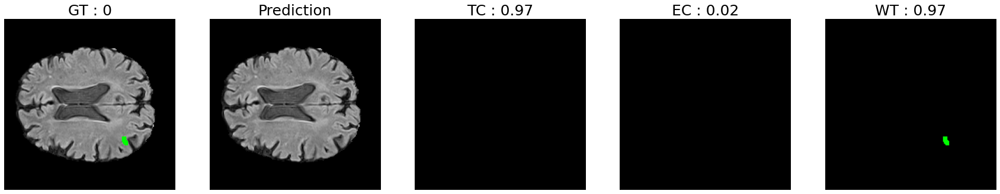

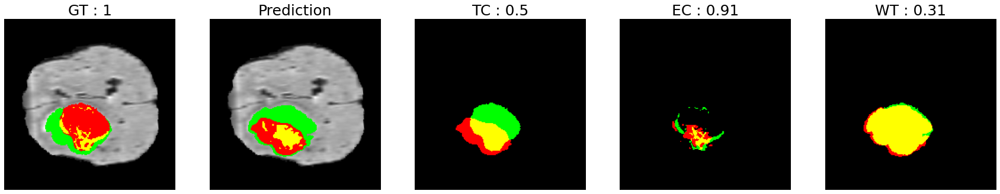

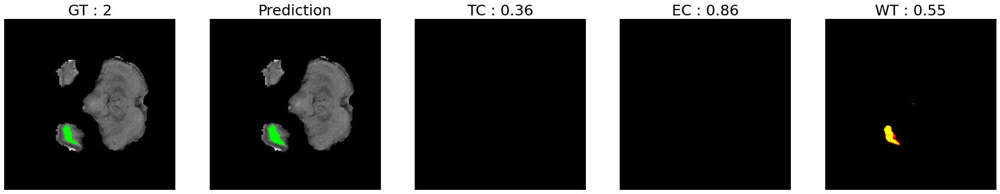

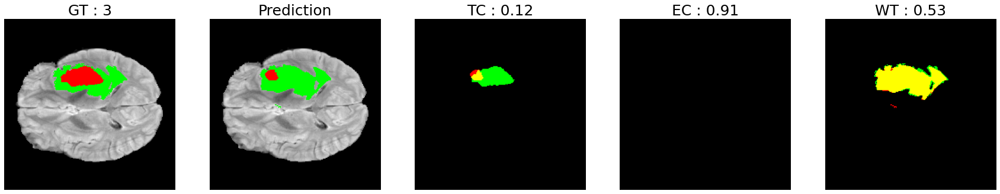

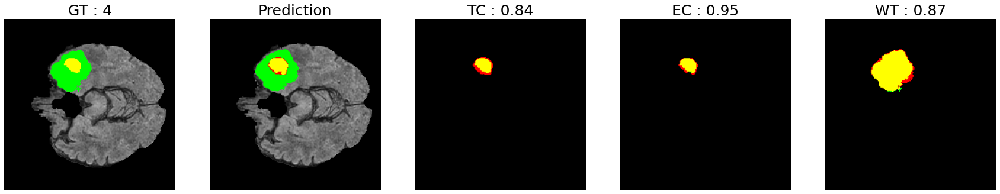

...

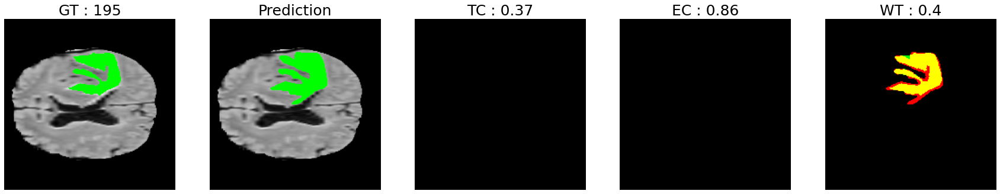

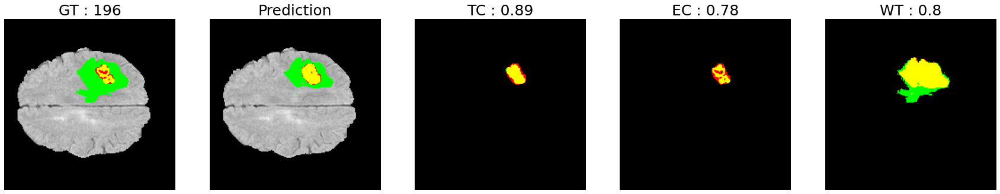

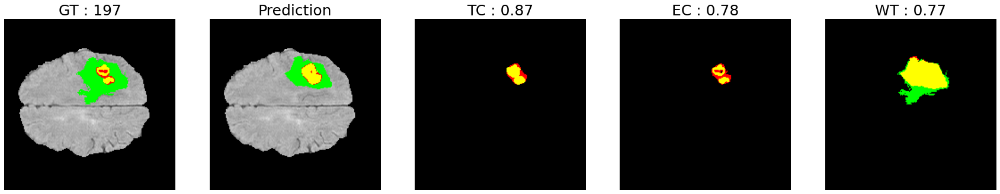

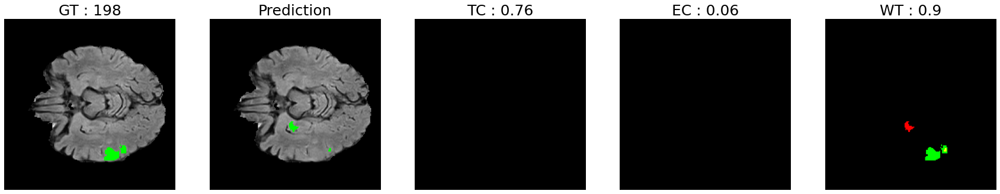

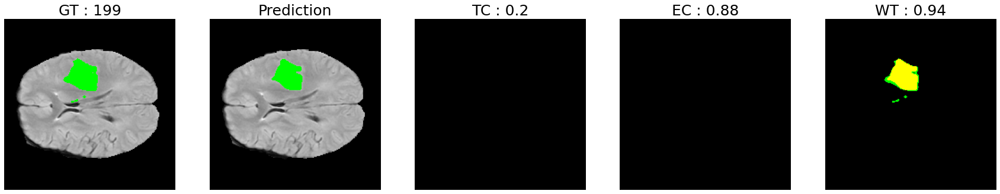

In [13]:
All_view(Xval[:200], Yval[:200], Y_net)#DLU

1/1 [==============================] - 0s 2ms/step - loss: 0.0659 - mean_iou: 0.8872 - dice_coef: 0.9810 - C_2: 0.9426 - C_3: 0.7364 - C_4: 0.9428


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


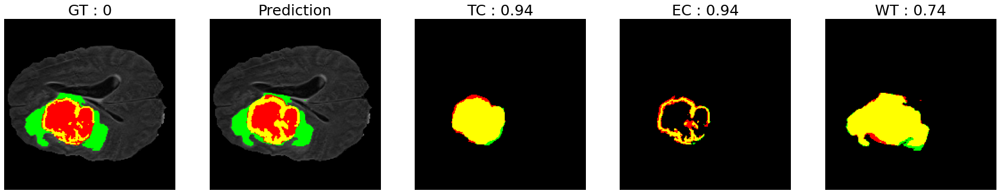

In [14]:
All_view(FoldX1[346:347], FoldY1[346:347], Y_net)

In [9]:
results = Y_net.fit(Xtrain, Ytrain, batch_size=16,epochs=30, callbacks=callbacks,validation_data=(Xval, Yval))

Epoch 1/30
1119/1119 [==============================] - 790s 706ms/step - loss: 0.0949 - mean_iou: 0.6982 - dice_coef: 0.9362 - C_2: 0.4681 - C_3: 0.3705 - C_4: 0.7181 - val_loss: 0.0996 - val_mean_iou: 0.7637 - val_dice_coef: 0.9321 - val_C_2: 0.5156 - val_C_3: 0.3891 - val_C_4: 0.7640 - lr: 0.0010
Epoch 2/30
1119/1119 [==============================] - 774s 692ms/step - loss: 0.0499 - mean_iou: 0.7841 - dice_coef: 0.9780 - C_2: 0.6965 - C_3: 0.6255 - C_4: 0.8430 - val_loss: 0.1769 - val_mean_iou: 0.7355 - val_dice_coef: 0.8413 - val_C_2: 0.6404 - val_C_3: 0.6193 - val_C_4: 0.8096 - lr: 0.0010
Epoch 3/30
1119/1119 [==============================] - 804s 719ms/step - loss: 0.0426 - mean_iou: 0.8112 - dice_coef: 0.9823 - C_2: 0.7587 - C_3: 0.6909 - C_4: 0.8681 - val_loss: 0.0545 - val_mean_iou: 0.8059 - val_dice_coef: 0.9791 - val_C_2: 0.7385 - val_C_3: 0.6842 - val_C_4: 0.8276 - lr: 0.0010
Epoch 4/30
1119/1119 [==============================] - 786s 703ms/step - loss: 0.0380 - mean_iou

Epoch 26/30
1119/1119 [==============================] - 780s 697ms/step - loss: 0.0207 - mean_iou: 0.8969 - dice_coef: 0.9925 - C_2: 0.9216 - C_3: 0.8471 - C_4: 0.9393 - val_loss: 0.0580 - val_mean_iou: 0.8174 - val_dice_coef: 0.9859 - val_C_2: 0.7831 - val_C_3: 0.7579 - val_C_4: 0.8680 - lr: 1.0000e-05
Epoch 27/30
1119/1119 [==============================] - 769s 687ms/step - loss: 0.0207 - mean_iou: 0.8970 - dice_coef: 0.9925 - C_2: 0.9214 - C_3: 0.8467 - C_4: 0.9392 - val_loss: 0.0579 - val_mean_iou: 0.8176 - val_dice_coef: 0.9859 - val_C_2: 0.7841 - val_C_3: 0.7576 - val_C_4: 0.8685 - lr: 1.0000e-05
Epoch 28/30
1119/1119 [==============================] - 768s 687ms/step - loss: 0.0206 - mean_iou: 0.8971 - dice_coef: 0.9925 - C_2: 0.9214 - C_3: 0.8475 - C_4: 0.9395 - val_loss: 0.0582 - val_mean_iou: 0.8177 - val_dice_coef: 0.9859 - val_C_2: 0.7842 - val_C_3: 0.7579 - val_C_4: 0.8684 - lr: 1.0000e-05
Epoch 29/30
1119/1119 [==============================] - 772s 690ms/step - loss: 0

In [11]:
Y_net.evaluate(Xval, Yval, verbose=1,batch_size=16)# gives accuracy and loss as specified

266/266 [==============================] - 24s 89ms/step - loss: 0.0581 - mean_iou: 0.8169 - dice_coef: 0.9859 - C_2: 0.7839 - C_3: 0.7583 - C_4: 0.8675


[0.05807363986968994,
 0.8168693780899048,
 0.9858527183532715,
 0.7838600277900696,
 0.7583246231079102,
 0.8674939870834351]

In [14]:
Y_net.save_weights('/home/seungbin/Attention_Unet/DEEPLAB/Model_save/U_Net_Norm.h5')